<a href="https://colab.research.google.com/github/wondoro/MBA6636_SM22_dataset/blob/main/F25_I01_Entropy_Gini_Wycliffe_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from sklearn import tree, metrics
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from io import StringIO
from IPython.display import Image
import pydotplus

In [ ]:
data = 'https://raw.githubusercontent.com/wondoro/datasets/refs/heads/main/segmentation-data.csv'

In [ ]:
segmentationData = pd.read_csv(data)

In [ ]:
segmentationData.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [ ]:
segmentationData.shape

(2000, 8)

In [ ]:
segmentationData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


In [ ]:
segmentationData.describe(include= 'all')

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
count,2.000000e+03,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000
mean,1.000010e+08,0.457000,0.496500,35.909000,1.03800,120954.419000,0.810500,0.739000
std,5.774946e+02,0.498272,0.500113,11.719402,0.59978,38108.824679,0.638587,0.812533
min,1.000000e+08,0.000000,0.000000,18.000000,0.00000,35832.000000,0.000000,0.000000
25%,1.000005e+08,0.000000,0.000000,27.000000,1.00000,97663.250000,0.000000,0.000000
50%,1.000010e+08,0.000000,0.000000,33.000000,1.00000,115548.500000,1.000000,1.000000
75%,1.000015e+08,1.000000,1.000000,42.000000,1.00000,138072.250000,1.000000,1.000000
max,1.000020e+08,1.000000,1.000000,76.000000,3.00000,309364.000000,2.000000,2.000000


In [ ]:
segmentationData.columns

Index(['ID', 'Sex', 'Marital status', 'Age', 'Education', 'Income',
       'Occupation', 'Settlement size'],
      dtype='object')

In [ ]:
segmentationData.rename(columns = {"ID":"ID_Unique", "Sex":"Gender"}, inplace = True)

In [ ]:
segmentationData.columns

Index(['ID_Unique', 'Gender', 'Marital status', 'Age', 'Education', 'Income',
       'Occupation', 'Settlement size'],
      dtype='object')

In [ ]:
segmentationData["Gender"].describe()

,Gender
count,2000.000000
mean,0.457000
std,0.498272
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [ ]:
segmentationData["Gender"].unique()

array([0, 1])

In [ ]:
segmentationData["Gender"] = segmentationData["Gender"].map({0: "Female", 1: "Male"})

In [ ]:
segmentationData["Gender"].describe()

,Gender
count,2000
unique,2
top,Female
freq,1086


In [ ]:
segmentationData["Gender"].unique()

array(['Female', 'Male'], dtype=object)

In [ ]:
segmentationData["Gender"].value_counts()

,count
Gender,
Female,1086
Male,914


In [ ]:
segmentationData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   ID_Unique        2000 non-null   int64 
 1   Gender           2000 non-null   object
 2   Marital status   2000 non-null   int64 
 3   Age              2000 non-null   int64 
 4   Education        2000 non-null   int64 
 5   Income           2000 non-null   int64 
 6   Occupation       2000 non-null   int64 
 7   Settlement size  2000 non-null   int64 
dtypes: int64(7), object(1)
memory usage: 125.1+ KB


In [ ]:
segmentationData["Marital status"].describe()

,Marital status
count,2000.000000
mean,0.496500
std,0.500113
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [ ]:
segmentationData["Marital status"].unique()
segmentationData["Marital status"] = segmentationData["Marital status"].map({0: "Unmarried", 1: "Married"})

In [ ]:
segmentationData["Marital status"].describe()

,Marital status
count,2000
unique,2
top,Unmarried
freq,1007


In [ ]:
segmentationData["Marital status"].unique()

array(['Unmarried', 'Married'], dtype=object)

In [ ]:
segmentationData["Marital status"].value_counts()

,count
Marital status,
Unmarried,1007
Married,993


In [ ]:
segmentationData['Education'].unique()

array([2, 1, 0, 3])

In [ ]:
segmentationData["Education"] = segmentationData["Education"].map({0: "Diploma", 1: "Degree", 2: "Master", 3: "PhD"})

In [ ]:
segmentationData["Education"].describe()

,Education
count,2000
unique,4
top,Degree
freq,1386


In [ ]:
segmentationData["Education"].value_counts()

,count
Education,
Degree,1386
Master,291
Diploma,287
PhD,36


In [ ]:
segmentationData["Education"].unique()

array(['Master', 'Degree', 'Diploma', 'PhD'], dtype=object)

In [ ]:
segmentationData["Occupation"].describe()

,Occupation
count,2000.000000
mean,0.810500
std,0.638587
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,2.000000


In [ ]:
segmentationData["Occupation"].unique()

array([1, 0, 2])

In [ ]:
segmentationData["Occupation"] = segmentationData["Occupation"].map({0: "Public", 1: "Private", 2:"Others" })

In [ ]:
segmentationData["Occupation"].describe()

,Occupation
count,2000
unique,3
top,Private
freq,1113


In [ ]:
segmentationData["Occupation"].value_counts()

,count
Occupation,
Private,1113
Public,633
Others,254


In [ ]:
segmentationData["Occupation"].unique()

array(['Private', 'Public', 'Others'], dtype=object)

In [ ]:
segmentationData["Settlement size"].describe()

,Settlement size
count,2000.000000
mean,0.739000
std,0.812533
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,2.000000


In [ ]:
segmentationData["Settlement size"].unique()

array([2, 0, 1])

In [ ]:
segmentationData["Settlement size"] = segmentationData["Settlement size"].map({0: "Village", 1: "Town", 2:"City" })

In [ ]:
segmentationData["Settlement size"].value_counts()

,count
Settlement size,
Village,989
Town,544
City,467


In [ ]:
segmentationData['Settlement size'].unique()

array(['City', 'Village', 'Town'], dtype=object)

In [ ]:
segmentationData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   ID_Unique        2000 non-null   int64 
 1   Gender           2000 non-null   object
 2   Marital status   2000 non-null   object
 3   Age              2000 non-null   int64 
 4   Education        2000 non-null   object
 5   Income           2000 non-null   int64 
 6   Occupation       2000 non-null   object
 7   Settlement size  2000 non-null   object
dtypes: int64(3), object(5)
memory usage: 125.1+ KB


In [ ]:
NOPrediction = segmentationData.dropna()
NOPrediction["Gender"].describe()

,Gender
count,2000
unique,2
top,Female
freq,1086


In [ ]:
NOPrediction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   ID_Unique        2000 non-null   int64 
 1   Gender           2000 non-null   object
 2   Marital status   2000 non-null   object
 3   Age              2000 non-null   int64 
 4   Education        2000 non-null   object
 5   Income           2000 non-null   int64 
 6   Occupation       2000 non-null   object
 7   Settlement size  2000 non-null   object
dtypes: int64(3), object(5)
memory usage: 125.1+ KB


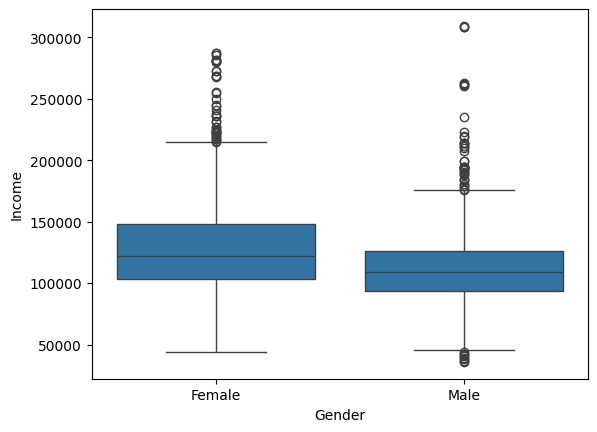

In [ ]:
sns.boxplot(y="Income", x= "Gender", data=NOPrediction)
plt.show()

The immediate conclusion from this boxplot is that both gender show income inequality with many outliers though more males having low income compared to female.

<Axes: xlabel='Age', ylabel='Income'>

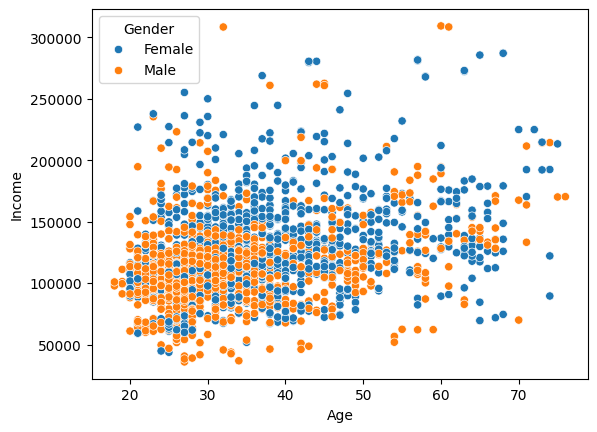

In [ ]:
sns.scatterplot(y="Income", x= "Age", hue = "Gender", data =NOPrediction)

This scatter diagram depicts that age and income between the two genders tend to be weak to moderate positive correlation. It means that income tends to rise with age though not much as other factors like education, occupation, settlement size may be some contributing factors to consider.

In [ ]:
target_column = "Marital status"

In [ ]:
y = segmentationData[target_column]
X = segmentationData.drop(columns=[target_column, "ID_Unique"])

In [ ]:
from google.colab import data_table
data_table.enable_dataframe_formatter()

In [ ]:
from google.colab import data_table
# import 'segmentation-data'

In [ ]:
X_train, X_test, y_train, y_test= train_test_split(X, y,
                                                  test_size = 0.25,
                                                  random_state = 246)

In [ ]:
y_train.describe()

,Marital status
count,1500
unique,2
top,Unmarried
freq,761


In [ ]:
X_train = pd.get_dummies(X_train)

In [ ]:
X_test = pd.get_dummies(X_test)

In [ ]:
rs = 0
entr_model = tree.DecisionTreeClassifier(criterion="entropy", random_state = rs)

In [ ]:
entr_model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [ ]:
y_pred = entr_model.predict(X_test)

In [ ]:
y_pred = pd.Series(y_pred)

In [ ]:
entr_model

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [ ]:
dot_data = StringIO()

In [ ]:
tree.export_graphviz(entr_model, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,
                class_names = ["Married","Unmarried"])

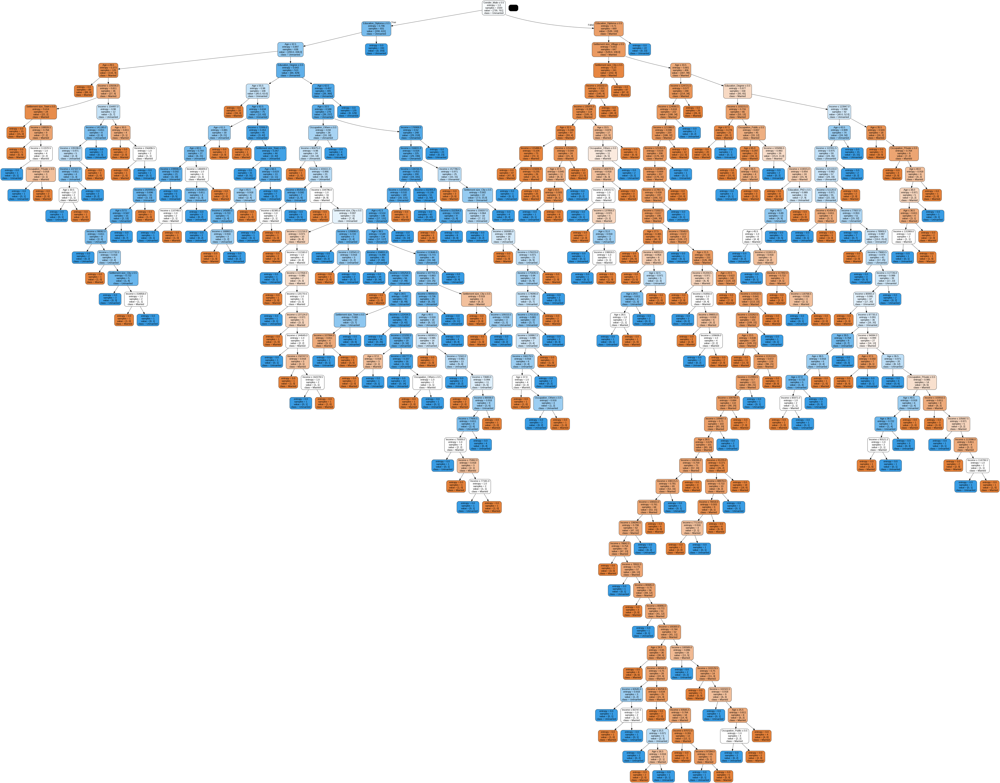

In [ ]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
print("Model Entropy - no max depth")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Married"' , metrics.precision_score(y_test,y_pred, pos_label = "Married"))
print('Precision score for "Unmarried"' , metrics.precision_score(y_test,y_pred, pos_label = "Unmarried"))
print('Recall score for "Married"' , metrics.recall_score(y_test,y_pred, pos_label = "Married"))
print('Recall score for "Unmarried"' , metrics.recall_score(y_test,y_pred, pos_label = "Unmarried"))

Model Entropy - no max depth
Accuracy: 0.838
Balanced accuracy: 0.838310607515524
Precision score for "Married" 0.8559670781893004
Precision score for "Unmarried" 0.8210116731517509
Recall score for "Married" 0.8188976377952756
Recall score for "Unmarried" 0.8577235772357723


The general accuracy is 0.838. This could be due to assumptions of categorization.

In [ ]:
gini_model = tree.DecisionTreeClassifier(criterion="gini", random_state= rs)

In [ ]:
gini_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [ ]:
y_pred = gini_model.predict(X_test)

In [ ]:
y_pred = pd.Series(y_pred)

In [ ]:
gini_model

DecisionTreeClassifier(random_state=0)

In [ ]:
dot_data = StringIO()
tree.export_graphviz(gini_model, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["Married", "Unmarried"])

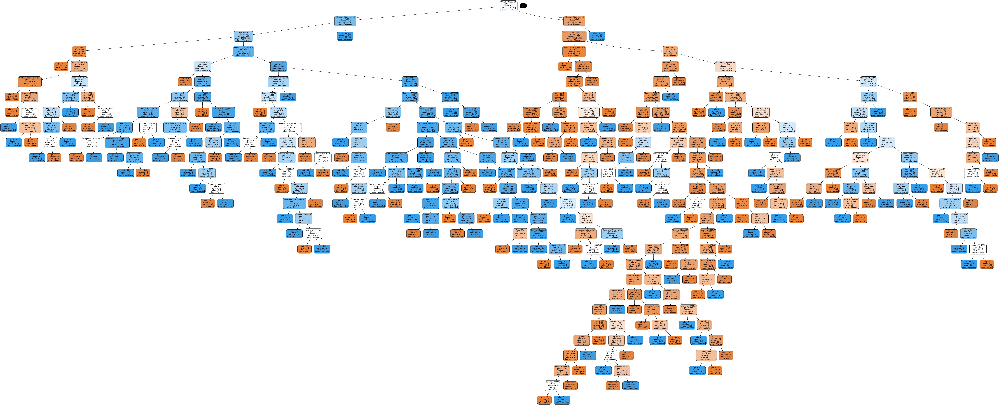

In [ ]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
print("Model Gini impurity model")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Married"' , metrics.precision_score(y_test,y_pred, pos_label = "Married"))
print('Precision score for "Unmarried"' , metrics.precision_score(y_test,y_pred, pos_label = "Unmarried"))
print('Recall score for "Married"' , metrics.recall_score(y_test,y_pred, pos_label = "Married"))
print('Recall score for "Unmarried"' , metrics.recall_score(y_test,y_pred, pos_label = "Unmarried"))

Model Gini impurity model
Accuracy: 0.832
Balanced accuracy: 0.8322770629281095
Precision score for "Married" 0.8483606557377049
Precision score for "Unmarried" 0.81640625
Recall score for "Married" 0.8149606299212598
Recall score for "Unmarried" 0.8495934959349594


How do the results here compare to the previous model? Write your judgements here:

Gini model has lower total accuracy and balanced accuracy.

In [ ]:
depth = 3
entr_model2 = tree.DecisionTreeClassifier(criterion="entropy", max_depth = depth, random_state = rs)
entr_model2.fit(X_train, y_train)
y_pred = entr_model2.predict(X_test)
y_pred = pd.Series(y_pred)
entr_model2

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=0)

In [ ]:
dot_data = StringIO()
tree.export_graphviz(entr_model2, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["Married", "Unmarried"])

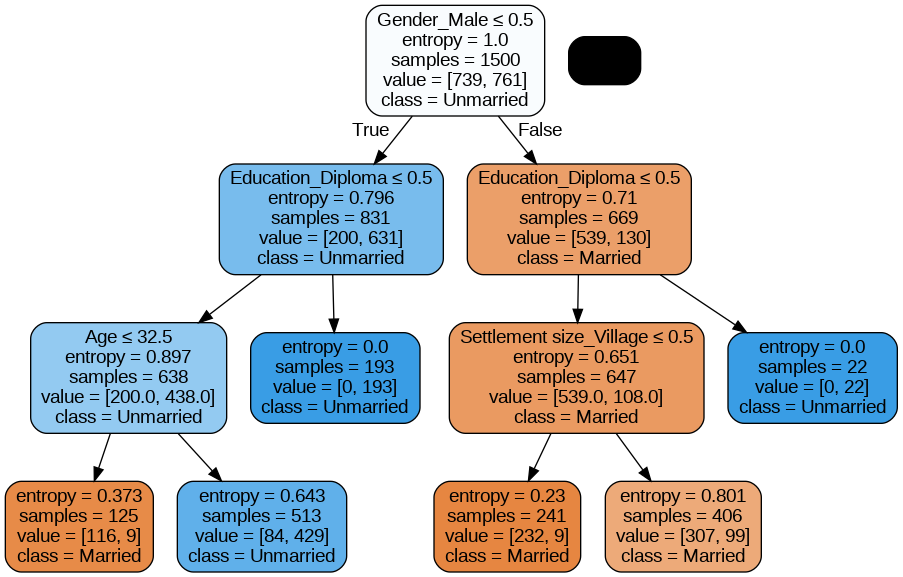

In [ ]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
print("Model Entropy model max depth 3")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Married"' , metrics.precision_score(y_test,y_pred, pos_label = "Married"))
print('Recall score for "Unmarried"' , metrics.recall_score(y_test,y_pred, pos_label = "Unmarried"))

Model Entropy model max depth 3
Accuracy: 0.86
Balanced accuracy: 0.8596440688816337
Precision score for "Married" 0.8484848484848485
Recall score for "Unmarried" 0.8373983739837398



The accuracy has increased since decreasing depth means decreasing variance. Thus reducing the problem of overfitting and making model better.

In [ ]:
gini_model2 = tree.DecisionTreeClassifier(criterion='gini', random_state= rs, max_depth = depth)

In [ ]:
gini_model2.fit(X_train, y_train)
y_pred = gini_model2.predict(X_test)
y_pred = pd.Series(y_pred)
gini_model2

DecisionTreeClassifier(max_depth=3, random_state=0)

In [ ]:
dot_data = StringIO()
tree.export_graphviz(gini_model2, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["Married", "FEMALE"])

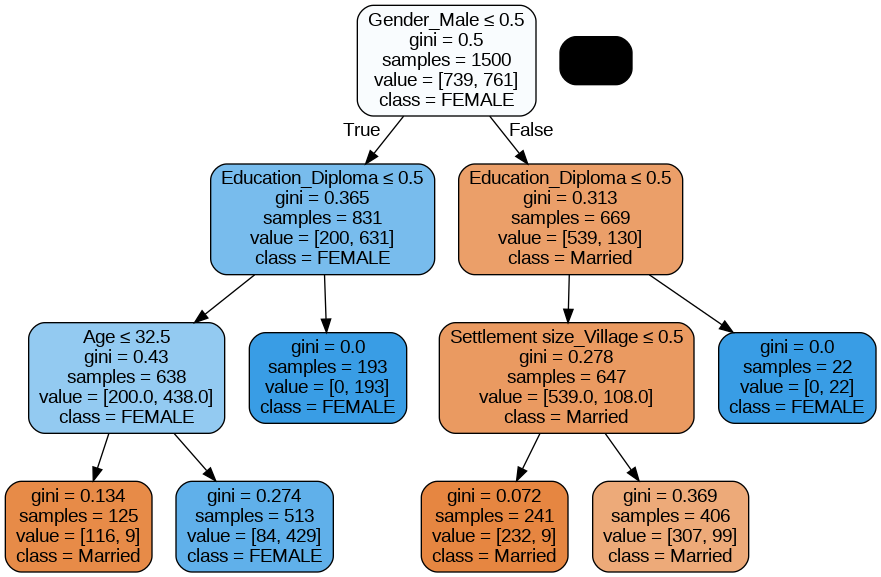

In [ ]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [ ]:
print("Gini impurity  model - max depth 3")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Married"' , metrics.precision_score(y_test,y_pred, pos_label = "Married"))
print('Recall score for "Unmarried"' , metrics.recall_score(y_test,y_pred, pos_label = "Unmarried"))

Gini impurity  model - max depth 3
Accuracy: 0.86
Balanced accuracy: 0.8596440688816337
Precision score for "Married" 0.8484848484848485
Recall score for "Unmarried" 0.8373983739837398


Now this is an elegant tree. Its accuracy might not be the highest, but it's still the best model produced as the shortest depth while maintaining the accuracy of over 0.86.
No missing data in the dataset thus no need for further future prediction.

In [ ]:
from sklearn.metrics import classification_report
y_pred = gini_model2.predict(X_test)
print(f"\nModel Performance for predicting '{target_column}':\n")
print(classification_report(y_test, y_pred))


Model Performance for predicting 'Marital status':

              precision    recall  f1-score   support

     Married       0.85      0.88      0.86       254
   Unmarried       0.87      0.84      0.85       246

    accuracy                           0.86       500
   macro avg       0.86      0.86      0.86       500
weighted avg       0.86      0.86      0.86       500



In [ ]:
sample_X = X_test.iloc[:10]
sample_y_true = y_test.iloc[:10]
sample_y_pred = gini_model2.predict(sample_X)

In [ ]:
print(f"\n First 10 Predictions for '{target_column}':")
for i in range(10):
    print(f"Person {i+1}: True={sample_y_true.iloc[i]} | Predicted={sample_y_pred[i]}")


 First 10 Predictions for 'Marital status':
Person 1: True=Married | Predicted=Married
Person 2: True=Unmarried | Predicted=Unmarried
Person 3: True=Married | Predicted=Married
Person 4: True=Unmarried | Predicted=Married
Person 5: True=Unmarried | Predicted=Unmarried
Person 6: True=Married | Predicted=Married
Person 7: True=Unmarried | Predicted=Unmarried
Person 8: True=Unmarried | Predicted=Unmarried
Person 9: True=Unmarried | Predicted=Unmarried
Person 10: True=Unmarried | Predicted=Unmarried
